# **Installations**

In [0]:
# !apt-get install openslide-tools
# !apt-get install python-openslide
# !pip3 install openslide-python
# !pip3 install torch torchvision
# !pip3 install tensorboard
%load_ext tensorboard

In [0]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
# !unzip gdrive/My\ Drive/Datasets/VocDataset/VOCDataset.zip
!unzip gdrive/My\ Drive/Datasets/PodocyteDataset.zip
!unzip gdrive/My\ Drive/Datasets/TPodo.zip

Archive:  gdrive/My Drive/Datasets/PodocyteDataset.zip
   creating: PodocyteDataset/
   creating: PodocyteDataset/training/
   creating: PodocyteDataset/training/images/
  inflating: PodocyteDataset/training/images/101_0_17.jpg  
  inflating: PodocyteDataset/training/images/101_47_17.jpg  
  inflating: PodocyteDataset/training/images/101_47_0.jpg  
  inflating: PodocyteDataset/training/images/102_0_0.jpg  
  inflating: PodocyteDataset/training/images/101_0_0.jpg  
  inflating: PodocyteDataset/training/images/102_0_250.jpg  
  inflating: PodocyteDataset/training/images/102_0_394.jpg  
  inflating: PodocyteDataset/training/images/102_1000_0.jpg  
  inflating: PodocyteDataset/training/images/102_1000_250.jpg  
  inflating: PodocyteDataset/training/images/102_1000_394.jpg  
  inflating: PodocyteDataset/training/images/102_1138_0.jpg  
  inflating: PodocyteDataset/training/images/102_1138_250.jpg  
  inflating: PodocyteDataset/training/images/102_1138_394.jpg  
  inflating: PodocyteDataset/

# **Imports**

In [0]:
import numpy as np
from glob import glob
import os
from PIL import Image
from keras.utils.np_utils import to_categorical
import torch
from torch.utils.data import Dataset, SubsetRandomSampler
from torchvision.transforms import Compose, ToTensor, Resize
import torchvision.transforms.functional as Ft
import random
from matplotlib import pyplot as plt
# import openslide as op
# import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
# import sys

# sys.path.append('H-AI-L-master/Codes/')
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from collections import OrderedDict
from sklearn.metrics import jaccard_score as js
from sklearn.metrics import f1_score as fs

Using TensorFlow backend.


In [0]:
root = 'gdrive/My Drive/IS'

# **Dataset Utils**

In [0]:
def loader(dataset, batch_size, num_workers=1, shuffle=True, sampler=None):
    data_loader = torch.utils.data.DataLoader(dataset,
                                              batch_size,
                                              num_workers=num_workers,
                                              shuffle=shuffle,sampler=sampler)
    return data_loader


def to_categorical_image(image, num_classes):
    return to_categorical(image,num_classes)

class ToLable(object):
    def __init__(self,num_class):
        self.num_class = num_class
    
    def __call__(self, image):
        image = np.array(image)
        cat_image = to_categorical_image(image,self.num_class)
        return torch.from_numpy(cat_image).permute(2,0,1).long()

class ReLable(object):
    def __init__(self, value, replacement):
        self.value = value
        self.replacement = replacement
        
    def __call__(self, image):
        image = np.array(image)
        image = np.where(image==self.value, self.replacement, image)
        return image

class VOCDataset(Dataset):
    
    def __init__(self,root, input_dir, lable_dir, image_size=(256,256), augment=True):
        self.root = root
        self.input_dir = input_dir
        self.lable_dir = lable_dir
        self.input_paths = sorted(`)))
        self.lable_paths = sorted(glob(os.path.join(self.root, '{}/*.png'.format(lable_dir))))
        self.image_size = image_size
        self.augment = augment
        
        self.transform = Compose([Resize(self.image_size),ToTensor()])
        self.lable_transform = Compose([Resize(self.image_size), ReLable(255,0), ToLable(21)])
        
        print("input: {} | lable: {}".format(len(self.input_paths),len(self.lable_paths)))
        if len(self.input_paths) == 0 or len(self.lable_paths) == 0:
              raise Exception("No images/lables are found in {}".format(self.root))
        
    def __getitem__(self,index):
        p = self.lable_paths[index]
        filename = os.path.basename(p).split(".")[0]
        image = Image.open(os.path.join(self.root,"{}/{}.jpg").format(self.input_dir,filename)).convert('RGB')
        lable = Image.open(self.lable_paths[index]).convert('P')
        
        if self.augment:
            # Flip Vertically
            if random.random() > 0.5:
                image = ImageOps.mirror(image)
                lable = ImageOps.mirror(lable)
            # Flip Horizontally
            if random.random() > 0.5:
                image = ImageOps.flip(image)
                lable = ImageOps.flip(lable)
            
        # Re orient the image for pytorch
        image = self.transform(image)
        lable = self.lable_transform(lable)

        return image, lable
    
    def __len__(self):
        return len(self.lable_paths)
    
    def tensor_pil(tensor, type=torch.FloatTensor):
        tensor = tensor.cpu()
        tensor = tensor.type(type)
        return Ft.to_pil_image(tensor)

In [0]:
class PodocyteDataset(Dataset):
    def __init__(self, root, images_dir, labels_dir, image_size=(256,256), augment=True):
        self.root = root
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.image_paths = sorted(glob(os.path.join(self.root, '{}/*.jpg'.format(images_dir))))
        self.label_paths = sorted(glob(os.path.join(self.root, '{}/*.png'.format(labels_dir))))
        self.image_size = image_size
        self.augment = augment
        
        self.transform = Compose([Resize(self.image_size),ToTensor()])
        self.label_transform = Compose([Resize(self.image_size), ReLable(255,0), ToLable(4)])
        
        print("input: {} | lable: {}".format(len(self.image_paths),len(self.label_paths)))
        if len(self.image_paths) == 0 or len(self.label_paths) == 0:
              raise Exception("No images/lables are found in {}".format(self.root))
    
    def fix_labels(self, l):
        if {85, 170, 255}.intersection(np.unique(np.array(l))):
            l =  Image.fromarray(np.array(l)/85)
        return l

    def __getitem__(self, index):
        image = Image.open(self.image_paths[index]).convert('RGB')
        label = Image.open(self.label_paths[index]).convert('P')
        label = self.fix_labels(label)
        rotate = [0, 90, 180, -90]
        if self.augment and self.is_annotated(label):
            r = random.randint(0,3)
            image = image.rotate(rotate[r])
            label = label.rotate(rotate[r])
        
        image = self.transform(image)
        label = self.label_transform(label)
        return image, label
    
    def is_annotated(self, image):
        if not isinstance(image, np.ndarray):
            image = np.array(image)
        l_set = set(np.unique(image))
        s = {0,1,2,3}

        return len(l_set) > 1 and len(s.intersection(l_set)) > 1

    def get_graymap(image, num=4):
        if isinstance(image, torch.Tensor):
            image = image.cpu().numpy()
        pal = np.linspace(0,255,num=num)
        return pal[image]
    
    def __len__(self):
        return len(self.image_paths)

    def get_marginal(self, indices):
        class_count = torch.zeros(4,dtype=torch.float32)
        for i in indices:
            _, target = self.__getitem__(i)
            target = target.clone().type(torch.float32)
            t = torch.sum(target, (1,2))
            class_count = torch.add(class_count, t)
        total = torch.sum(class_count)
        if total != len(indices)*256*256:
            raise Exception('pixel count dont match')
        result = class_count/total
        return 1/result

In [0]:
# wsi_path = 'P87.svs'
# xml_path = 'P87.xml'

# wsi = op.OpenSlide(wsi_path)

# wsi_thumb = wsi.get_thumbnail((7000,7000))

# plt.imsave('P87.png',np.array(wsi_thumb))

# wsi.dimensions

# from xml_to_mask import xml_to_mask
# xStart,yStart,xSize,ySize = 8000,3000,5000,5000
# image = wsi.read_region((xStart,yStart),0,(xSize,ySize))
# # mask = xml_to_mask(image,)

# np.array(image).shape

# plt.imshow(image)

# mask = xml_to_mask(xml_path,(xStart,yStart),(xSize,ySize))

# # mask += 10
# mask *= 50
# # rgb_mask = np.array([mask,mask,mask])
# plt.imshow(mask,cmap='gray')

# np.unique(mask).size

# h,w = wsi.dimensions
# size = 2000

# for yStart in range(0,h,size):
#     for xStart in range(0,w,size):
#         image = wsi.read_region((xStart,yStart),0,(size,size))
#         plt.imsave('images/P87/region_'+str(xStart)+'-'+str(yStart)+'.png',np.array(image))
#         mask = xml_to_mask(xml_path,(xStart,yStart),(size,size))
#         print(np.unique(mask))
# #         mask += 10
#         mask *= 50
#         plt.imsave('images/P87/mask_'+str(xStart)+'-'+str(yStart)+'.png',mask)

# import cv2
# mask = cv2.imread('images/P87/mask_6000-2000.png')
# img = cv2.imread('images/P87/region_6000-2000.png')
# fig = plt.figure(figsize=(8,8))
# fig.add_subplot(2,2,1)
# plt.imshow(img)
# fig.add_subplot(2,2,2)
# plt.imshow(mask)

# cv2.addWeighted(img,1,mask,0.5,0,img)
# plt.imshow(img)

In [0]:
def save_image(fname, img, grayscale=True):
    cmap = None
    if grayscale: 
        cmap = 'gray'
    plt.imsave(fname,img, cmap='gray')
    print("{} saved!".format(fname))

# **Layers**

In [0]:
_BATCH_NORM = nn.BatchNorm2d
_BOTTLENECK_EXPANSION = 4

In [0]:
class _ConvBnReLU(nn.Sequential):
    """
    Cascade of 2D convolution, batch norm, and ReLU.
    """

    BATCH_NORM = _BATCH_NORM

    def __init__(
        self, in_ch, out_ch, kernel_size, stride, padding, dilation=1, relu=True, bn=True
    ):
        super(_ConvBnReLU, self).__init__()
        conv = nn.Conv2d(in_ch, out_ch, kernel_size, stride, padding, dilation, bias=False)
        nn.init.xavier_uniform_(conv.weight)
        self.add_module("conv", conv)
        
        if bn:
            self.add_module("bn", _BATCH_NORM(out_ch, eps=1e-5, momentum=0.999))

        if relu:
            self.add_module("relu", nn.LeakyReLU())

In [0]:
class _ImagePool(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.conv = _ConvBnReLU(in_ch, out_ch, 1, 1, 0, 1)

    def forward(self, x):
        _, _, H, W = x.shape
        h = self.pool(x)
        h = self.conv(h)
        h = F.interpolate(h, size=(H, W), mode="bilinear", align_corners=False)
        return h

In [0]:
class _ASPP(nn.Module):
    """
    Atrous spatial pyramid pooling with image-level feature
    """

    def __init__(self, in_ch, out_ch, rates):
        super(_ASPP, self).__init__()
        self.stages = nn.Module()
        self.stages.add_module("c0", _ConvBnReLU(in_ch, out_ch, 1, 1, 0, 1))
        for i, rate in enumerate(rates):
            self.stages.add_module(
                "c{}".format(i + 1),
                _ConvBnReLU(in_ch, out_ch, 3, 1, padding=rate, dilation=rate),
            )
        self.stages.add_module("imagepool", _ImagePool(in_ch, out_ch))

    def forward(self, x):
        return torch.cat([stage(x) for stage in self.stages.children()], dim=1)

In [0]:
class _Bottleneck(nn.Module):
    """
    Bottleneck block of MSRA ResNet.
    """

    def __init__(self, in_ch, out_ch, stride, dilation, downsample):
        super(_Bottleneck, self).__init__()
        mid_ch = out_ch // _BOTTLENECK_EXPANSION
        self.reduce = _ConvBnReLU(in_ch, mid_ch, 1, stride, 0, 1, True)
        self.conv3x3 = _ConvBnReLU(mid_ch, mid_ch, 3, 1, dilation, dilation, True)
        self.increase = _ConvBnReLU(mid_ch, out_ch, 1, 1, 0, 1, False)
        self.shortcut = (
            _ConvBnReLU(in_ch, out_ch, 1, stride, 0, 1, False)
            if downsample
            else lambda x: x  # identity
        )

    def forward(self, x):
        h = self.reduce(x)
        h = self.conv3x3(h)
        h = self.increase(h)
        h += self.shortcut(x)
        return F.relu(h)


class _ResLayer(nn.Sequential):
    """
    Residual layer with multi grids
    """

    def __init__(self, n_layers, in_ch, out_ch, stride, dilation, multi_grids=None):
        super(_ResLayer, self).__init__()

        if multi_grids is None:
            multi_grids = [1 for _ in range(n_layers)]
        else:
            assert n_layers == len(multi_grids)

        # Downsampling is only in the first block
        for i in range(n_layers):
            self.add_module(
                "block{}".format(i + 1),
                _Bottleneck(
                    in_ch=(in_ch if i == 0 else out_ch),
                    out_ch=out_ch,
                    stride=(stride if i == 0 else 1),
                    dilation=dilation * multi_grids[i],
                    downsample=(True if i == 0 else False),
                ),
            )


class _Stem(nn.Sequential):
    """
    The 1st conv layer.
    Note that the max pooling is different from both MSRA and FAIR ResNet.
    """

    def __init__(self, out_ch):
        super(_Stem, self).__init__()
        self.add_module("conv1", _ConvBnReLU(3, out_ch, 7, 2, 3, 1))
        self.add_module("pool", nn.MaxPool2d(3, 2, 1, ceil_mode=False))

# **Generator**

In [0]:
class DeepLabV3Plus(nn.Module):
    """
    DeepLab v3+: Dilated ResNet with multi-grid + improved ASPP + decoder
    """

    def __init__(self, n_classes, n_blocks, atrous_rates, multi_grids, output_stride):
        super(DeepLabV3Plus, self).__init__()

        # Stride and dilation
        if output_stride == 8:
            s = [1, 2, 1, 1]
            d = [1, 1, 2, 4]
        elif output_stride == 16:
            s = [1, 2, 2, 1]
            d = [1, 1, 1, 2]

        # Encoder
        ch = [64 * 2 ** p for p in range(6)]
        self.layer1 = _Stem(ch[0])
        self.layer2 = _ResLayer(n_blocks[0], ch[0], ch[2], s[0], d[0])
        self.layer3 = _ResLayer(n_blocks[1], ch[2], ch[3], s[1], d[1])
        self.layer4 = _ResLayer(n_blocks[2], ch[3], ch[4], s[2], d[2])
        self.layer5 = _ResLayer(n_blocks[3], ch[4], ch[5], s[3], d[3], multi_grids)
        self.aspp = _ASPP(ch[5], 256, atrous_rates)
        concat_ch = 256 * (len(atrous_rates) + 2)
        self.add_module("fc1", _ConvBnReLU(concat_ch, 256, 1, 1, 0, 1))

        # Decoder
        self.reduce = _ConvBnReLU(256, 48, 1, 1, 0, 1)
        self.fc2 = nn.Sequential(
            OrderedDict(
                [
                    ("conv1", _ConvBnReLU(304, 256, 3, 1, 1, 1)),
                    ("conv2", _ConvBnReLU(256, 256, 3, 1, 1, 1)),
                    ("conv3", nn.Conv2d(256, n_classes, kernel_size=1)),
                ]
            )
        )

    def forward(self, x):
        h = self.layer1(x)
        h = self.layer2(h)
        h_ = self.reduce(h)
        h = self.layer3(h)
        h = self.layer4(h)
        h = self.layer5(h)
        h = self.aspp(h)
        h = self.fc1(h)
        h = F.interpolate(h, size=h_.shape[2:], mode="bilinear", align_corners=False)
        h = torch.cat((h, h_), dim=1)
        h = self.fc2(h)
        h = F.interpolate(h, size=x.shape[2:], mode="bilinear", align_corners=False)
        return h
    
    def load_model(self, path, extension=None):
        if extension:
            path = path+extension

        if os.path.exists(path):
            checkpoint = torch.load(path)
            self.load_state_dict(checkpoint['model_state_dict'])
            print('Model Loaded at {} epoch!'.format(checkpoint['epoch']))

# **Critic**

In [0]:
class CriticNetwork(nn.Module):
    """
    Critic Network from SegAN architecture.
    """
    
    def __init__(self, in_ch):
        super(CriticNetwork, self).__init__()
        ch = [32 * 2**p for p in range(5)]
        self.layer1 = _ConvBnReLU(in_ch,ch[0],7,2,3,bn=False) # 256,256,63
        self.layer2 = _ConvBnReLU(ch[0],ch[1],5,2,2) #
        self.layer3 = _ConvBnReLU(ch[1],ch[2],4,2,1,1)
        self.layer4 = _ConvBnReLU(ch[2],ch[3],4,2,1,1)
        self.layer5 = _ConvBnReLU(ch[3],ch[4],3,1,0,1)
    
    def forward(self, x):
        size = x.shape[0]
        h1 = self.layer1(x)
        h2 = self.layer2(h1)
        h3 = self.layer3(h2)
        h4 = self.layer4(h3)
        h5 = self.layer5(h4)

        return torch.cat((x.view(size,-1), h1.view(size,-1),
                          h2.view(size,-1), h3.view(size,-1),
                          h4.view(size,-1), h5.view(size,-1)),1)
        
    def load_model(self, path, extension=None):
        if extension:
            path = path+extension

        if os.path.exists(path):
            checkpoint = torch.load(path)
            self.load_state_dict(checkpoint['model_state_dict'])
            print('Model Loaded at {} epoch!'.format(checkpoint['epoch']))

In [0]:
def get_mask(inputs, masks):
    c = inputs.shape[1]
    masks = masks.type(torch.FloatTensor)
    masked_images = inputs.clone()
    if torch.cuda.is_available():
        masks = masks.cuda()
        masked_images = masked_images.cuda()
    for ch in range(c):
        masked_images[:, ch, :, :] = (inputs[:, ch, :, :].unsqueeze(1) * masks).squeeze(1)
    return masked_images

def get_mask_classes(inputs, masks):
    cm = masks.shape[1]
    return torch.cat([get_mask(inputs,masks[:,c,:,:].unsqueeze(1)) for c in range(cm)],1)
        
def get_marginal(target, inverse=False, eps=1e-5):
    target = target.clone()
    target = target.type(torch.FloatTensor)
    if torch.cuda.is_available():
        target = target.cuda()
    # B X C X N X N
    t = torch.sum(target, (0,2,3))
    total = torch.sum(t)
    if total != (target.shape[0]*target.shape[2]*target.shape[3]):
        raise Exception('Formula Incorrect!!')
    result = t/total
    result[result==0.0] = eps
    return 1.0/result if inverse else result

# **Evaluation Metric**

In [0]:
def dice_loss(input,target):
    num=input*target
    num=torch.sum(num,dim=2)
    num=torch.sum(num,dim=2)

    den1=input*input
    den1=torch.sum(den1,dim=2)
    den1=torch.sum(den1,dim=2)

    den2=target*target
    den2=torch.sum(den2,dim=2)
    den2=torch.sum(den2,dim=2)

    dice=2*(num/(den1+den2))

    dice_total=1-1*torch.sum(dice)/dice.size(0)#divide by batchsize

    return dice_total


def f1_score(target, prediction, classes=list(range(4))):
    target = target.cpu()
    prediction = prediction.cpu()
    target = np.array(target).ravel()
    prediction = np.array(prediction).ravel()
    return fs(target, prediction, labels=classes, average='micro')

def jaccard_score(target,prediction, classes=list(range(4))):
    target = target.cpu()
    prediction = prediction.cpu()
    target = np.array(target).ravel()
    prediction = np.array(prediction).ravel()
    return js(target, prediction, labels=classes, average='micro')
    

In [0]:
from torch.utils.tensorboard import SummaryWriter
from os import path

def train_s21_1c(gen, dis, data_loader ,batch_size=2, iterations = 1, epochs=1,val_data=None, backup=None, logfile='', outputs='', class_weight = torch.tensor([1,1,1,1])):

    if torch.cuda.is_available():
        gen = gen.cuda()
        dis = dis.cuda()

    optimizerG = torch.optim.Adam(gen.parameters(), lr=5e-5)
    optimizerD = torch.optim.Adam(dis.parameters(), lr=5e-6)
    e_start = 0

    if backup:        
        if path.exists('{}.pt'.format(backup[0])):
            checkpointG = torch.load('{}.pt'.format(backup[0]))
            gen.load_state_dict(checkpointG['model_state_dict'])
            optimizerG.load_state_dict(checkpointG['optimizer_state_dict'])
            e_start = checkpointG['epoch'] + 1
            print('Generator ReLoaded!!')

        if path.exists('{}.pt'.format(backup[1])):
            checkpointD = torch.load('{}.pt'.format(backup[1]))
            dis.load_state_dict(checkpointD['model_state_dict'])
            optimizerD.load_state_dict(checkpointD['optimizer_state_dict'])
            print('Discriminator ReLoaded!!')
        if e_start > 0:
            print("Resuming training from epoch: {}".format(e_start))

    writer = SummaryWriter(logfile, purge_step = e_start*iterations)
    data_iter = iter(data_loader)
    data = None
    gen.train()
    dis.train()
    criterion = nn.L1Loss()
    gen_criterion = nn.CrossEntropyLoss(class_weight)
    loss_one = 1.0
    loss_two = 1.0
    for e in range(e_start,epochs):
        for i in range(iterations):
            
            try:
                data = next(data_iter)
            except StopIteration:
                data_iter = iter(data_loader)
                data = next(data_iter)

            if data is None:
                raise Exception('Dataset cannot be None')
            dis.zero_grad()
            inputs, targets = data[0],data[1]
            
            if torch.cuda.is_available():
                inputs = inputs.cuda()
                targets = targets.cuda()

            # training the Discriminator 
            pred = gen(inputs)
            
            pred = F.softmax(pred,dim=1)
            # pred = pred.detach()
#             pred_value = pred.argmax(1).unsqueeze(1)
#             print(pred.shape)
            # pred = pred.type(torch.float32)
            
            # prediction masks
            # pred_masks = get_mask_classes(inputs,pred.detach())
            # pred_features = dis(pred_masks)
            pred_features = dis(get_mask_classes(inputs,pred.detach()))
            
            # target masks
            # target_masks = get_mask_classes(inputs,targets)
            # target_features = dis(target_masks)
            target_features = dis(get_mask_classes(inputs,targets))
            
            loss_D = -loss_two*criterion(pred_features,target_features)
            loss_D.backward()
            optimizerD.step()
            
            # weight clipping
            for p in dis.parameters():
                p.data.clamp_(-0.05,0.05)

            gen.zero_grad()
            
            # training the Generator
            predict = gen(inputs)
            pred = F.softmax(predict,dim=1)
            # pred_value = pred_value.type(torch.float32)
            # prediction masks
            # pred_masks = get_mask_classes(inputs,pred)
            # pred_features = dis(pred_masks)
            pred_features = dis(get_mask_classes(inputs,pred))
            
            # target masks
            # target_masks = get_mask_classes(inputs,targets)
            # target_features = dis(target_masks)
            target_features = dis(get_mask_classes(inputs,targets))
            
            lossG = loss_one*gen_criterion(predict,targets.argmax(1))
            
            lossD = loss_two*criterion(pred_features,target_features)
#             dice_loss1 = dice_loss(pred_value,targets)
            loss = lossD + lossG
            loss.backward()
            optimizerG.step()
            
            print("Epoch %d/%d  iteration %d/%d D loss: %.3f, Total loss: %.3f, Generator Loss: %.3f, GAN Loss: %.3f" % 
                  (e, epochs, i, iterations, loss_D, loss, lossG, lossD))
            
#             print("Epoch %d/%d  iteration %d/%d D loss: %f, GAN loss: %f, Dice Loss: %f" % 
#                   (e, epochs, i, iterations, loss_D, loss, dice_loss1))
            it = e*iterations + i
            writer.add_scalar('Total Loss',loss, it)
            writer.add_scalar('Discriminator Loss', loss_D, it)
            writer.add_scalar('Generator Loss', lossG, it)
        

            if val_data != None and (it%int(iterations/2) == 0):
                gen.eval()
                img,target = val_data
                if torch.cuda.is_available():
                    img = img.cuda()
                    target = target.cuda()
                target = target.argmax(1)
                pred = gen(img)
                writer.add_scalar('Validation Loss', gen_criterion(pred,target), it)
                target = target
                pred = F.softmax(pred,dim=1).argmax(1)
                writer.add_scalar('IoUs', jaccard_score(target[0],pred[0]), it)
                writer.add_scalar('F1 Score', f1_score(target[0], pred[0]), it)
                f, axarr = plt.subplots(1,3,figsize=(15,10))
                axarr[0].imshow(VOCDataset.tensor_pil(img[0]))
                axarr[0].set_xlabel('Original')
                axarr[1].imshow(PodocyteDataset.get_graymap(target[0]), cmap='gray')
                axarr[1].set_xlabel('Ground Truth')
                axarr[2].imshow(PodocyteDataset.get_graymap(pred[0]), cmap='gray')
                axarr[2].set_xlabel('Prediction')
                plt.savefig("{}/training_e{}_t{}.png".format(outputs, e, i))
                plt.close()
                gen.train()
        
        if backup:
            torch.save(
                {
                    'epoch': e,
                    'model_state_dict': gen.state_dict(),
                    'optimizer_state_dict': optimizerG.state_dict()
                }
                , "{}.pt".format(backup[0])
            )
            torch.save(
                {
                    'epoch': e,
                    'model_state_dict': dis.state_dict(),
                    'optimizer_state_dict': optimizerD.state_dict()
                }
                , "{}.pt".format(backup[1])
            )
            torch.cuda.empty_cache()
        

In [0]:
from torch.utils.tensorboard import SummaryWriter
from os import path

def train_s21_21c(gen, dis, data_loader ,batch_size=2, iterations = 1, epochs=1,val_data=None, backup=None, logfile='', outputs=''):

    if torch.cuda.is_available():
        gen = gen.cuda()
        dis = [d.cuda() for d in dis]

    optimizerG = torch.optim.Adam(gen.parameters(), lr=5e-6)
    optimizerD = [torch.optim.Adam(d.parameters(), lr=5e-7) for d in dis]
    e_start = 0

    if backup:        
        if path.exists(backup[0]):
            checkpointG = torch.load("{}.pt".form(backup[0]))
            gen.load_state_dict(checkpointG['model_state_dict'])
            optimizerG.load_state_dict(checkpointG['optimizer_state_dict'])
            e_start = checkpointG['epoch'] + 1
            print('Generator ReLoaded!!')

        for j in range(len(dis)):
            b = "{}_{}.pt".format(backup[1],j)
            if path.exists(b):
                checkpointD = torch.load(b)
                dis[j].load_state_dict(checkpointD['model_state_dict'])
                optimizerD[j].load_state_dict(checkpointD['optimizer_state_dict'])
                print('Discriminators ReLoaded!!')
        if e_start > 0:
            print("Resuming training from epoch: {}".format(e_start))

    writer = SummaryWriter(logfile, purge_step = e_start*iterations)
    data_iter = iter(data_loader)
    data = None
    gen.train()
    dis = [d.train() for d in dis]
    criterion = nn.L1Loss()
    gen_criterion = nn.CrossEntropyLoss()
    for e in range(e_start,epochs):
        for i in range(iterations):
            
            try:
                data = next(data_iter)
            except StopIteration:
                data_iter = iter(data_loader)
                data = next(data_iter)

            if data is None:
                raise Exception('Dataset cannot be None')
            
            for d in dis:
                d.zero_grad()
            
            inputs, targets = data[0],data[1]
            
            if torch.cuda.is_available():
                inputs = inputs.cuda()
                targets = targets.cuda()

            # training the Discriminator 
            pred = gen(inputs).detach()
            pred = F.softmax(pred,dim=1)
            losses = []
            # Train each discriminator
            for j in range(len(dis)):
                pred_features = dis[j](get_mask(inputs,pred[:,j,:,:].unsqueeze(1)))
                target_features = dis[j](get_mask(inputs,targets[:,j,:,:].unsqueeze(1)))
                loss_D = -criterion(pred_features,target_features)
                loss_D.backward()
                losses.append(loss_D)
                optimizerD[j].step()
            
            # clearing the gradients
            for d in dis:
                for p in d.parameters():
                    p.data.clamp_(-0.05,0.05)

            # Train generator using all discriminator loss
            gen.zero_grad()
            pred = gen(inputs)
            lossG = gen_criterion(pred,targets.argmax(1))
            lossD = []
            for j in range(len(dis)):
                pred_features = dis[j](get_mask(inputs,pred[:,j,:,:].unsqueeze(1)))
                target_features = dis[j](get_mask(inputs,targets[:,j,:,:].unsqueeze(1)))
                lossD.append(criterion(pred_features,target_features))
                
            loss = sum(lossD) + lossG
            loss.backward()
            optimizerG.step()
            
            print("Epoch %d/%d  iteration %d/%d D loss: %.3f, Total loss: %.3f, Generator Loss: %.3f, GAN Loss: %.3f" % 
                  (e, epochs, i, iterations, loss_D, loss, lossG, sum(lossD)))
            
#             print("Epoch %d/%d  iteration %d/%d D loss: %f, GAN loss: %f, Dice Loss: %f" % 
#                   (e, epochs, i, iterations, loss_D, loss, dice_loss1))
            it = e*iterations + i
            writer.add_scalar('Total Loss', loss, it)
            writer.add_scalar('Discriminator Loss', sum(losses), it)
            writer.add_scalar('Generator Loss', lossG, it)
        

            if val_data != None and (it%int(iterations/2) == 0):
                gen.eval()
                img,target = val_data
                if torch.cuda.is_available():
                    img = img.cuda()
                    target = target.cuda()
                target = target.argmax(1)
                pred = gen(img)
                writer.add_scalar('Validation Loss', gen_criterion(pred,target), it)
                target = target
                pred = F.softmax(pred,dim=1).argmax(1)
                writer.add_scalar('IoUs', jaccard_score(target[0],pred[0]), it)
                writer.add_scalar('F1 Score', f1_score(target[0], pred[0]), it)
                f, axarr = plt.subplots(1,3,figsize=(15,10))
                axarr[0].imshow(VOCDataset.tensor_pil(img[0]))
                axarr[0].set_xlabel('Original')
                axarr[1].imshow(PodocyteDataset.get_graymap(target[0]), cmap='gray')
                axarr[1].set_xlabel('Ground Truth')
                axarr[2].imshow(PodocyteDataset.get_graymap(pred[0]), cmap='gray')
                axarr[2].set_xlabel('Prediction')
                plt.savefig("{}/training_e{}_t{}.png".format(outputs, e, i))
                plt.close()
                gen.train()
        
        if backup:
            torch.save(
                {
                    'epoch': e,
                    'model_state_dict': gen.state_dict(),
                    'optimizer_state_dict': optimizerG.state_dict()
                }
                , "{}.pt".format(backup[0])
            )
            for i in range(len(dis)):
                torch.save(
                    {
                        'epoch': e,
                        'model_state_dict': dis[i].state_dict(),
                        'optimizer_state_dict': optimizerD[i].state_dict()
                    }
                    , "{}_{}.pt".format(backup[1], i)
                )
            torch.cuda.empty_cache()
        

# **TensorBoard**

In [0]:
%tensorboard --logdir gdrive/My\ Drive/IS/logs

In [0]:
batch_size=16
test_split = 0.1

In [0]:
dataset = PodocyteDataset('PodocyteDataset/training/','images/', 'masks/')
dataset_size = dataset.__len__()
indices = list(range(dataset_size))
split = int(dataset_size*test_split)
train_indices, test_indices = indices[:split], indices[split:]
train_sampler = SubsetRandomSampler(train_indices)
test_sampler = SubsetRandomSampler(test_indices)

data_loader = loader(dataset, batch_size, num_workers=0, shuffle=False ,sampler=train_sampler)
val_data_loader = loader(dataset, 3, num_workers=0, shuffle=False, sampler=test_sampler)
val_data = next(iter(val_data_loader))


input: 999 | lable: 999


In [0]:
class_weight = dataset.get_marginal(train_indices)
print(class_weight)
if torch.cuda.is_available():
    class_weight = class_weight.cuda()

tensor([  1.4777,   3.3902, 133.3292,  48.0562])


In [0]:
version = 'v3_1'
logfile41 = "{}/logs/41/wsi-code-{}".format(root, version)
backup41 = ('{}/models/generate-podocyte-41-{}'.format(root,version), '{}/models/discriminator-podocyte-41-{}'.format(root,version))
output41 = '{}/outputs/podocyte/4_1/{}'.format(root, version)
if not os.path.exists(output41):
    os.makedirs(output41, exist_ok=True)

In [0]:
backup41

('gdrive/My Drive/IS/models/generate-podocyte-41-v3_1',
 'gdrive/My Drive/IS/models/discriminator-podocyte-41-v3_1')

In [0]:
# %%time
# torch.cuda.empty_cache()
# gen = DeepLabV3Plus(n_classes=21,
#                     n_blocks=[3, 4, 6, 3], 
#                     atrous_rates=[6, 12, 18],
#                     multi_grids=[1, 2, 4], 
#                     output_stride=16)
# dis = CriticNetwork(21*3)
# batch_size=16
# # dataset = VOCDataset("VOCdevkit/VOC2012/","JPEGImages","SegmentationClass",(128,128))
# dataset = VOCDataset("","JPEGImages","MiniSegmentationClass",(256,256))
# val_dataset = VOCDataset("","JPEGImages","OneSample",(256,256))
# val_data_loader = loader(val_dataset,1,num_workers=0)
# data_loader = loader(dataset, batch_size, num_workers=0)

# val_data = next(iter(val_data_loader))
# backup = ('gdrive/My Drive/IS/models/generator_overfit.pt','gdrive/My Drive/IS/models/discriminator_overfit.pt')
# # train_s21_1c(gen, dis, data_loader, batch_size=batch_size, iterations=10,epochs=250,val_data=val_data, backup=backup)

In [0]:
%%time
gen41 = DeepLabV3Plus(n_classes=4,
                    n_blocks=[3, 4, 6, 3], 
                    atrous_rates=[6, 12, 18],
                    multi_grids=[1, 2, 4], 
                    output_stride=16)
dis = CriticNetwork(4*3)

# backup41 = ('gdrive/My Drive/IS/models/generator_podocyte.pt','gdrive/My Drive/IS/models/discriminator_podocyte.pt')
# train_s21_1c(gen41, dis, data_loader, batch_size=batch_size, iterations=100, epochs=250, val_data=val_data, backup=backup41, logfile=logfile41, outputs=output41, class_weight=class_weight)

CPU times: user 478 ms, sys: 6.42 ms, total: 485 ms
Wall time: 485 ms


In [0]:
logfile44 = "{}/logs/44/wsi-code-{}".format(root, version)
backup44 = ('{}/models/generate-podocyte-44-{}'.format(root,version), '{}/models/discriminator-podocyte-44-{}'.format(root,version))
output44 = '{}/outputs/podocyte/4_4/{}'.format(root, version)
if not os.path.exists(output44):
    os.mkdir(output44)

In [0]:
%%time
gen44 = DeepLabV3Plus(n_classes=4,
                    n_blocks=[3, 4, 6, 3], 
                    atrous_rates=[6, 12, 18],
                    multi_grids=[1, 2, 4], 
                    output_stride=16)
dis = [CriticNetwork(3) for _ in range(4)]
batch_size=16
dataset = PodocyteDataset('PodocyteDataset/training/','images/', 'masks/')
data_loader = loader(dataset, batch_size, num_workers=0)

val_dataset = PodocyteDataset('PodocyteDataset/test/', 'images/', 'masks/')
val_data = next(iter(loader(val_dataset, 3)))

backup44 = ('gdrive/My Drive/IS/models/generator_podocyte_m','gdrive/My Drive/IS/models/discriminator_podocyte_m')
# train_s21_21c(gen44, dis, data_loader, batch_size=batch_size, iterations=56, epochs=10,val_data=val_data, backup=backup)

input: 999 | lable: 999
input: 1512 | lable: 1512
CPU times: user 766 ms, sys: 95.9 ms, total: 862 ms
Wall time: 1.12 s


In [0]:
def get_predictions(gen, loader, folder, save=False):
    gen1 = gen.cpu()
    gen1.eval()
    j = 0
    fscore_avg = {0:[], 1:[], 2:[], 3:[]}
    iou_avg = {0:[], 1:[], 2:[], 3:[]}
    for val_data in iter(loader):
        pred = gen1(val_data[0])
        pred = F.softmax(pred,dim=1)
        ch = pred.shape[1]
        pred = pred.argmax(1)
        t = val_data[1].argmax(1)
        for i in range(len(val_data[0])):
            print(i)
            print("Prediction Classes: ",np.unique(np.array(pred[i]),return_counts=True))
            print("Actual Classes: ",np.unique(np.array(t[i]),return_counts=True))
            for k in range(ch):
                f = f1_score(t[i], pred[i], classes=[k])
                iou = jaccard_score(t[i], pred[i], classes=[k])
                fscore_avg[k].append(f)
                iou_avg[k].append(iou)
                print('Class {} f1-score: {:0.3f} iou: {:0.3f}'.format(k, f, iou))
            f, axarr = plt.subplots(1,3,figsize=(15,5))
            f.suptitle("{}) Jaccard Score: {:0.3f} | F1 Score: {:0.3f}".format(i, jaccard_score(t[i],pred[i]), f1_score(t[i], pred[i])))
            axarr[0].imshow(VOCDataset.tensor_pil(val_data[0][i]))
            axarr[0].set_xlabel('Original')
            axarr[1].imshow(PodocyteDataset.get_graymap(t[i]), cmap='gray')
            axarr[1].set_xlabel('Ground Truth')
            axarr[2].imshow(PodocyteDataset.get_graymap(pred[i]), cmap='gray')
            axarr[2].set_xlabel('Prediction')
            # axarr[0].imshow(VOCDataset.tensor_pil(val_data[0][i]))
            # axarr[1].imshow(VOCDataset.tensor_pil(t[i], torch.LongTensor))
            # axarr[2].imshow(VOCDataset.tensor_pil(pred[i], torch.LongTensor))
            if save:
                plt.savefig("{}/gen41_i{}.png".format(folder, i))
                plt.close()
        if j == 0:
            break
    print('\n'.join(['Average F1 Score label {}: {:0.3f}'.format(k, (sum(v)/float(len(v)))) for k, v in fscore_avg.items()]))
    print('\n'.join(['Average IoU label {}: {:0.3f}'.format(k, (sum(v)/float(len(v)))) for k, v in iou_avg.items()]))

In [0]:
# gen41 = load_model(gen41, backup41[0])
# gen44 = load_model(gen44, backup44[0], extension='.pt')
gen41.load_model(backup41[0], extension='.pt')

Model Loaded at 249 epoch!


0
Prediction Classes:  (array([0, 1, 2, 3]), array([29274, 32375,   188,  3699]))
Actual Classes:  (array([0, 1, 2, 3]), array([27546, 33732,   432,  3826]))
Class 0 f1-score: 0.967 iou: 0.935
Class 1 f1-score: 0.960 iou: 0.924
Class 2 f1-score: 0.513 iou: 0.345
Class 3 f1-score: 0.815 iou: 0.688
1
Prediction Classes:  (array([0, 1, 2, 3]), array([29269, 31380,    69,  4818]))
Actual Classes:  (array([0, 1, 2, 3]), array([27559, 32595,   668,  4714]))
Class 0 f1-score: 0.965 iou: 0.933
Class 1 f1-score: 0.955 iou: 0.915
Class 2 f1-score: 0.000 iou: 0.000
Class 3 f1-score: 0.786 iou: 0.647
2
Prediction Classes:  (array([0, 1, 2, 3]), array([24068, 34525,   112,  6831]))
Actual Classes:  (array([0, 1, 3]), array([25864, 32307,  7365]))
Class 0 f1-score: 0.901 iou: 0.819
Class 1 f1-score: 0.919 iou: 0.850
Class 2 f1-score: 0.000 iou: 0.000
Class 3 f1-score: 0.841 iou: 0.725
3
Prediction Classes:  (array([0, 1, 2, 3]), array([26545, 33591,   225,  5175]))
Actual Classes:  (array([0, 1, 2, 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true samples.
  'recall', 'true', average, warn_for)


Class 2 f1-score: 0.316 iou: 0.188
Class 3 f1-score: 0.789 iou: 0.652
4
Prediction Classes:  (array([0, 1, 3]), array([64876,   481,   179]))
Actual Classes:  (array([0, 1, 2]), array([62547,  2754,   235]))
Class 0 f1-score: 0.973 iou: 0.948
Class 1 f1-score: 0.061 iou: 0.032
Class 2 f1-score: 0.000 iou: 0.000
Class 3 f1-score: 0.000 iou: 0.000


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


5
Prediction Classes:  (array([0, 1, 3]), array([56562,  7910,  1064]))
Actual Classes:  (array([0, 1, 2, 3]), array([56141,  8484,   442,   469]))
Class 0 f1-score: 0.980 iou: 0.960
Class 1 f1-score: 0.849 iou: 0.738
Class 2 f1-score: 0.000 iou: 0.000
Class 3 f1-score: 0.536 iou: 0.366
6
Prediction Classes:  (array([0, 1, 2, 3]), array([32354, 28705,   117,  4360]))
Actual Classes:  (array([0, 1, 2, 3]), array([26573, 34484,   380,  4099]))
Class 0 f1-score: 0.883 iou: 0.790
Class 1 f1-score: 0.874 iou: 0.776
Class 2 f1-score: 0.000 iou: 0.000
Class 3 f1-score: 0.769 iou: 0.625
7
Prediction Classes:  (array([0, 1, 2, 3]), array([35081, 28039,   522,  1894]))
Actual Classes:  (array([0, 1, 2, 3]), array([40180, 23102,  1200,  1054]))
Class 0 f1-score: 0.908 iou: 0.831
Class 1 f1-score: 0.859 iou: 0.753
Class 2 f1-score: 0.443 iou: 0.284
Class 3 f1-score: 0.612 iou: 0.441
8
Prediction Classes:  (array([0, 1, 2, 3]), array([58064,  6516,   223,   733]))
Actual Classes:  (array([0, 1, 2, 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:778: UndefinedMetricWarning: Jaccard is ill-defined and being set to 0.0 due to no true or predicted samples.
  'true or predicted', average, ('jaccard',))


10
Prediction Classes:  (array([0, 1, 2, 3]), array([50628, 13988,   377,   543]))
Actual Classes:  (array([0, 1, 2, 3]), array([51359, 13653,   299,   225]))
Class 0 f1-score: 0.990 iou: 0.981
Class 1 f1-score: 0.948 iou: 0.900
Class 2 f1-score: 0.331 iou: 0.199
Class 3 f1-score: 0.268 iou: 0.155
11
Prediction Classes:  (array([0, 1, 2, 3]), array([46525, 16804,   155,  2052]))
Actual Classes:  (array([0, 1, 2, 3]), array([46364, 17244,   404,  1524]))
Class 0 f1-score: 0.996 iou: 0.991
Class 1 f1-score: 0.961 iou: 0.924
Class 2 f1-score: 0.000 iou: 0.000
Class 3 f1-score: 0.697 iou: 0.535
12
Prediction Classes:  (array([0, 1, 2]), array([63538,  1977,    21]))
Actual Classes:  (array([0]), array([65536]))
Class 0 f1-score: 0.985 iou: 0.970
Class 1 f1-score: 0.000 iou: 0.000
Class 2 f1-score: 0.000 iou: 0.000
Class 3 f1-score: 0.000 iou: 0.000
13
Prediction Classes:  (array([0, 1, 2, 3]), array([30533, 30242,   545,  4216]))
Actual Classes:  (array([0, 1, 2, 3]), array([30289, 30247, 

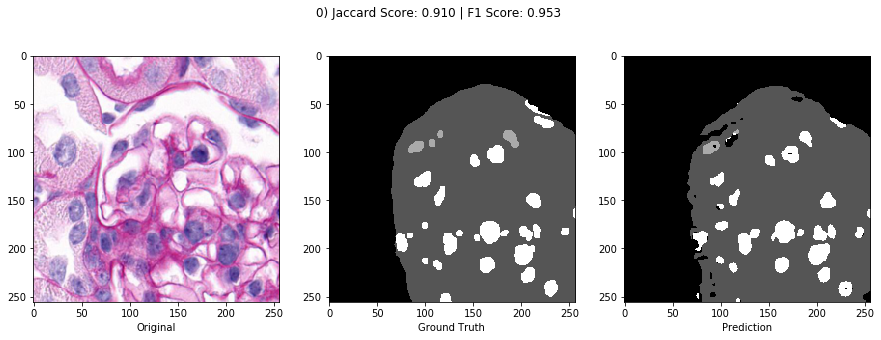

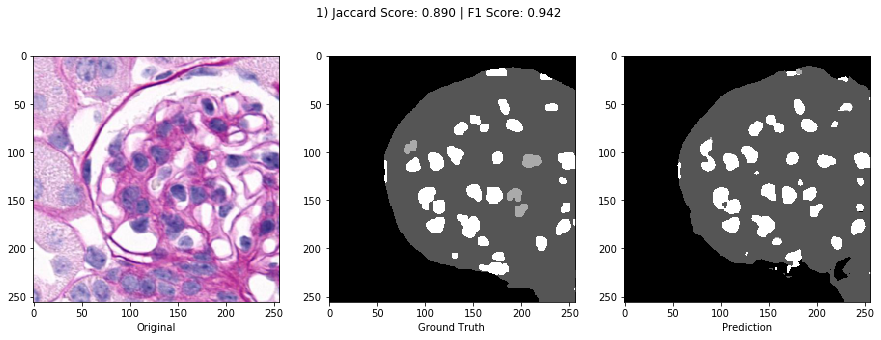

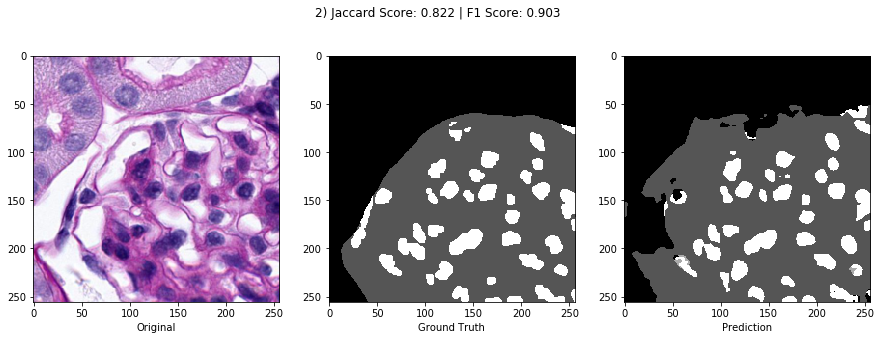

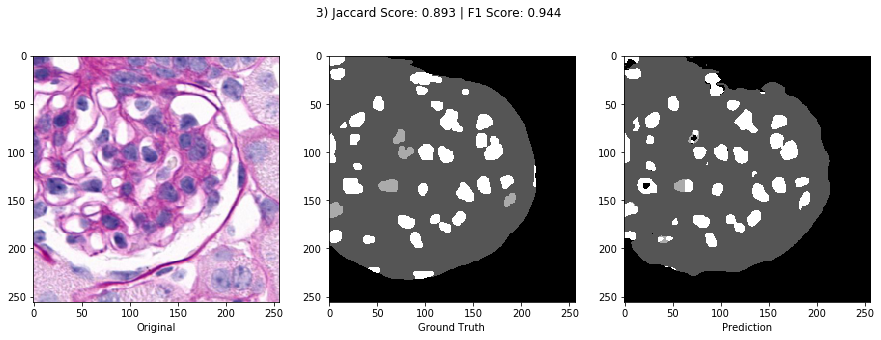

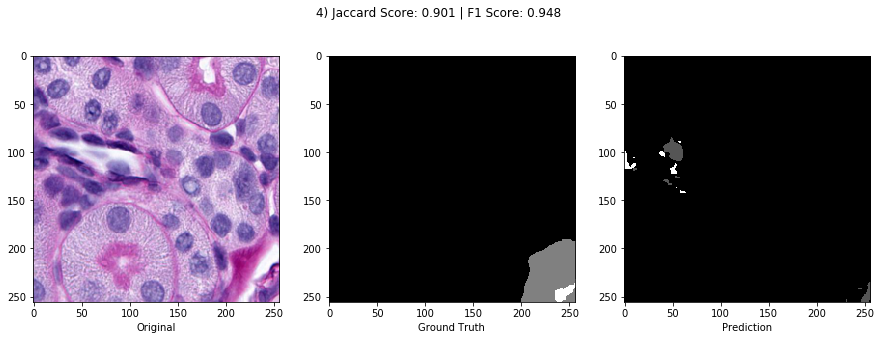

...

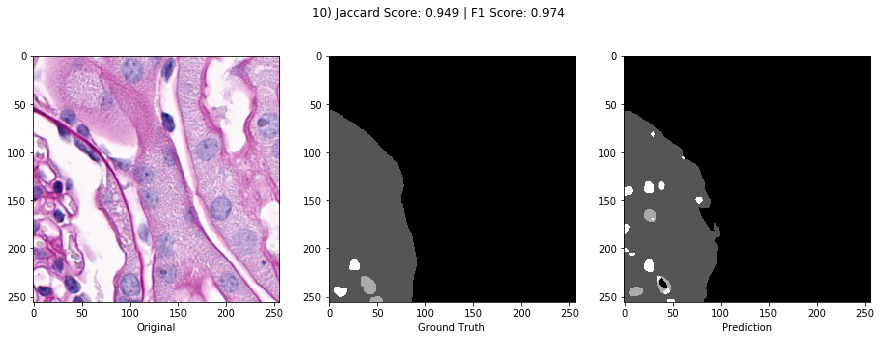

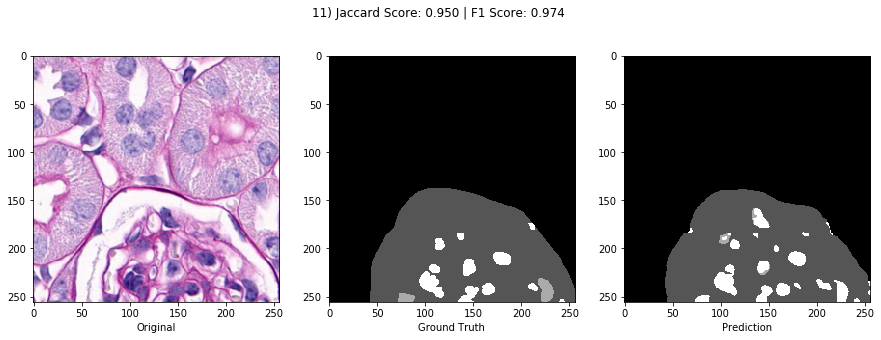

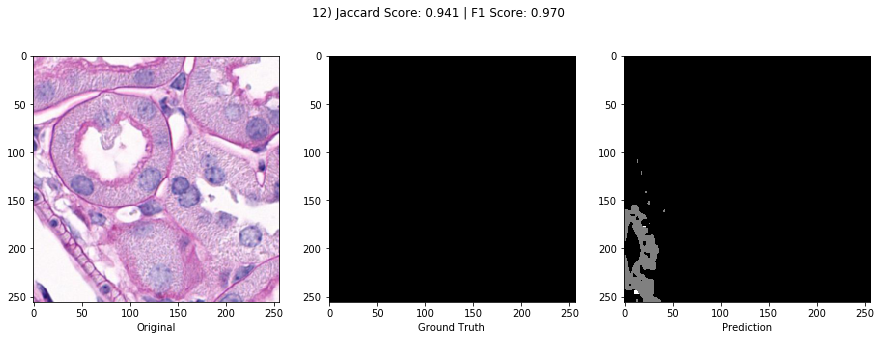

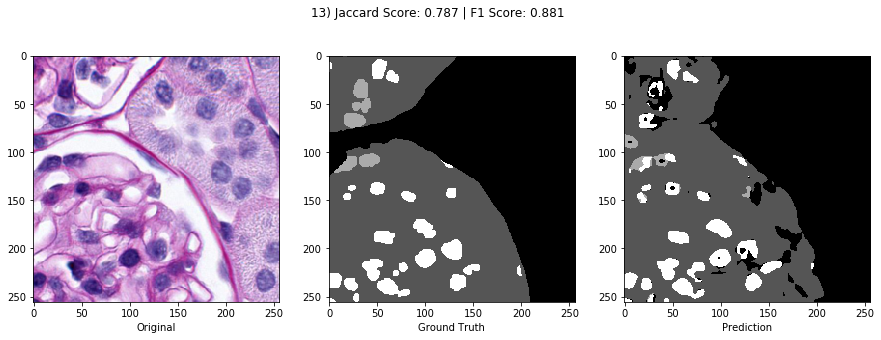

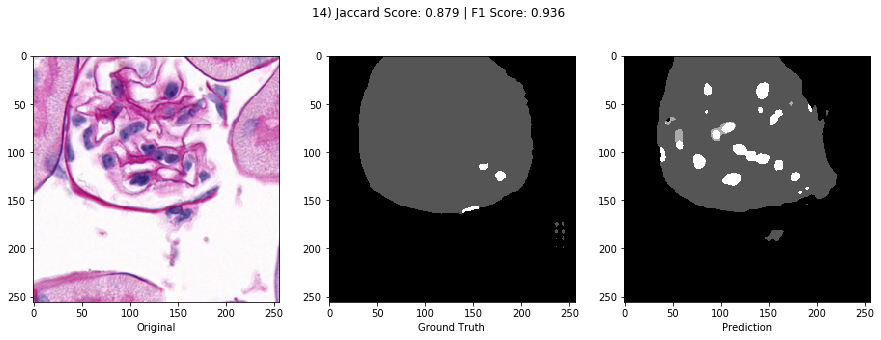

In [0]:
get_predictions(gen41, loader(dataset, 15,shuffle=False, sampler=test_sampler), 'gdrive/My Drive/IS/result')

input: 15 | lable: 15
0
Prediction Classes:  (array([0, 1, 3]), array([53332, 11792,   412]))
Actual Classes:  (array([0, 1, 2, 3]), array([56927,  8418,   169,    22]))
1
Prediction Classes:  (array([0, 1, 3]), array([41481, 21347,  2708]))
Actual Classes:  (array([0, 1, 2, 3]), array([44054, 18157,  3001,   324]))
2
Prediction Classes:  (array([0, 1, 3]), array([46049, 17226,  2261]))
Actual Classes:  (array([0, 1, 2]), array([53272,  9754,  2510]))
3
Prediction Classes:  (array([0, 1]), array([63568,  1968]))
Actual Classes:  (array([0, 1, 2]), array([62682,  2501,   353]))
4
Prediction Classes:  (array([0, 1, 3]), array([52712, 11984,   840]))
Actual Classes:  (array([0, 1, 2]), array([51320, 12129,  2087]))
5
Prediction Classes:  (array([0, 1, 3]), array([57532,  7697,   307]))
Actual Classes:  (array([0, 1, 2, 3]), array([54222,  9456,   945,   913]))
6
Prediction Classes:  (array([0, 1, 3]), array([52075, 12855,   606]))
Actual Classes:  (array([0, 1, 2, 3]), array([50762, 13104

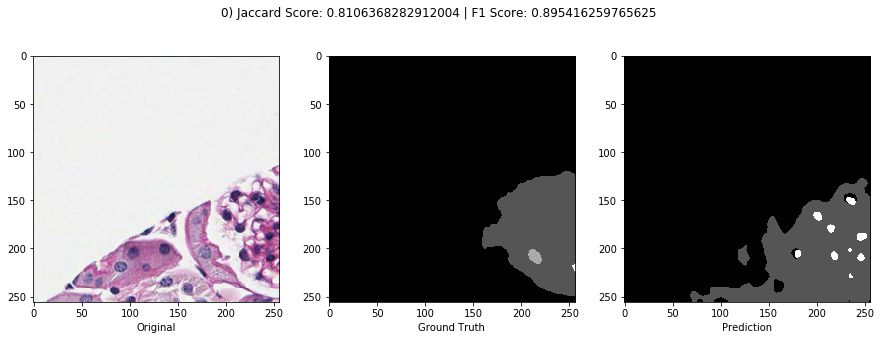

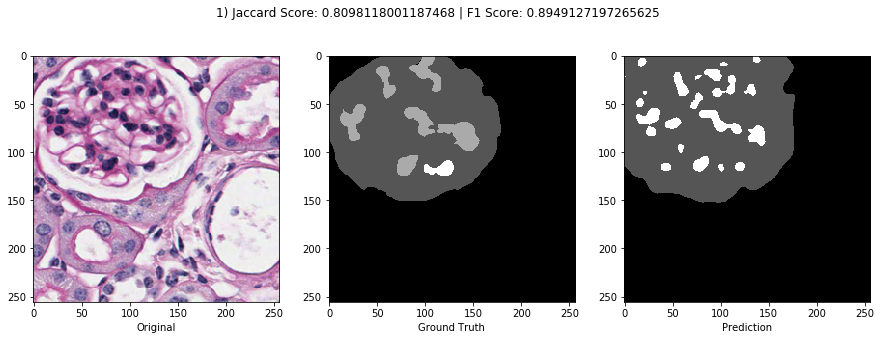

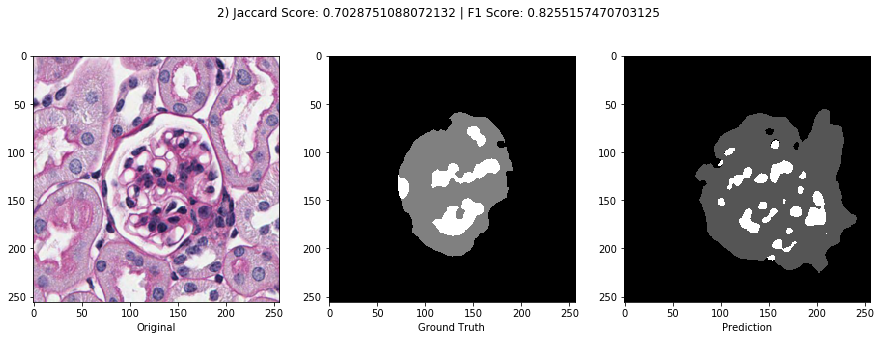

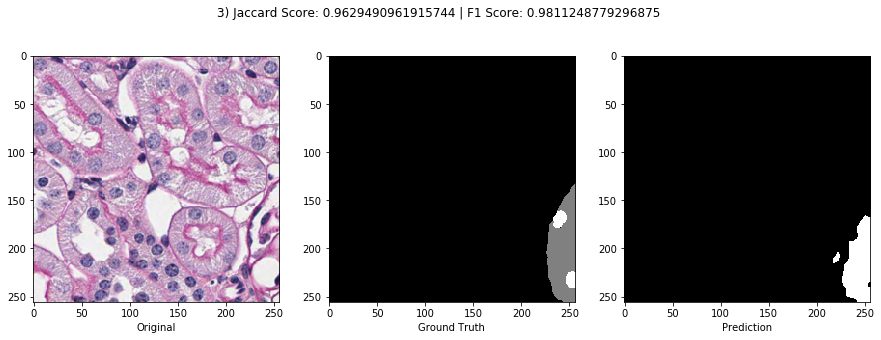

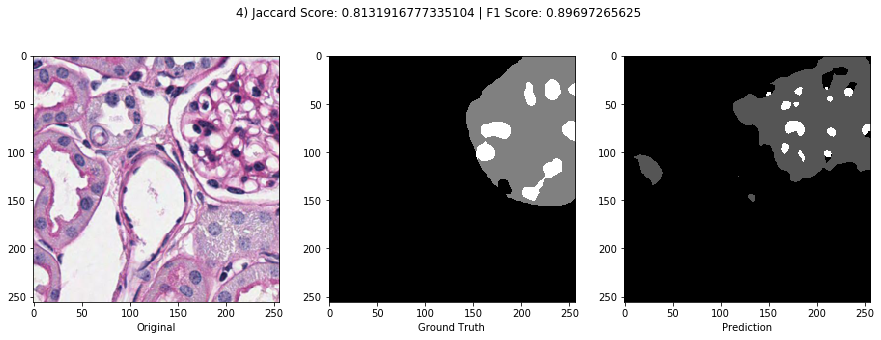

...

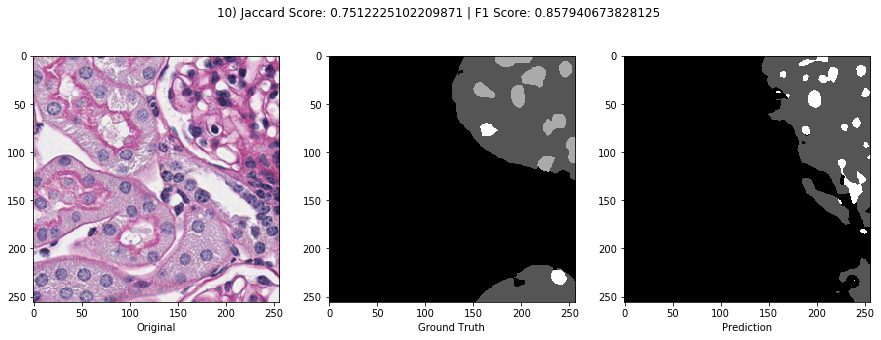

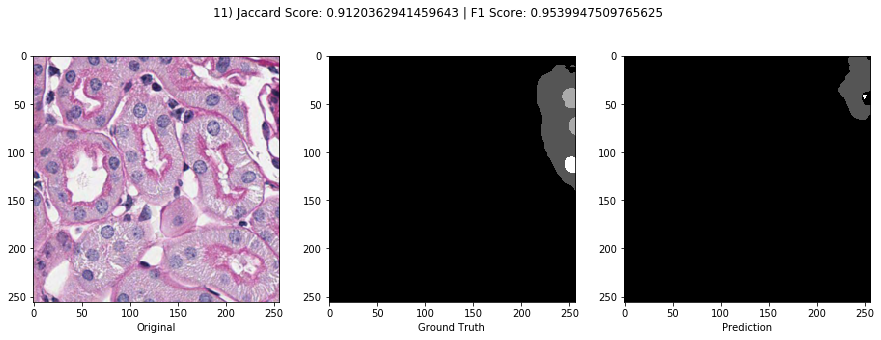

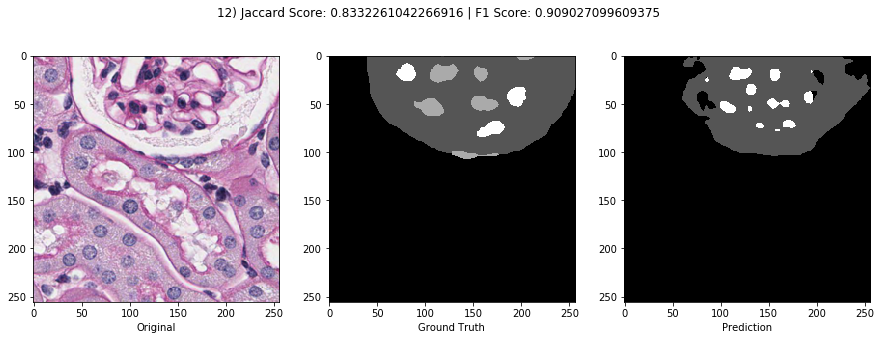

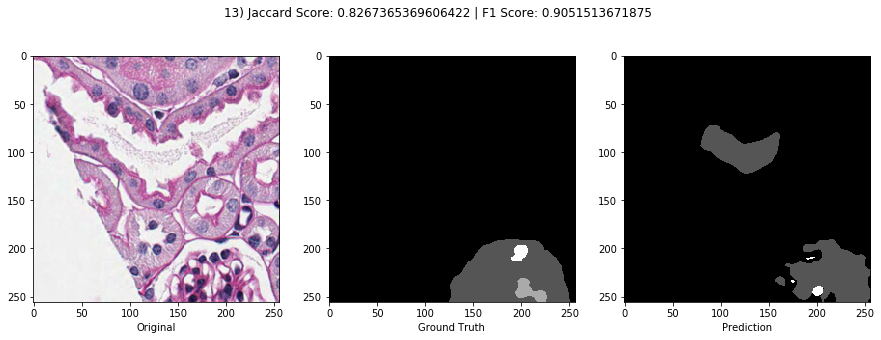

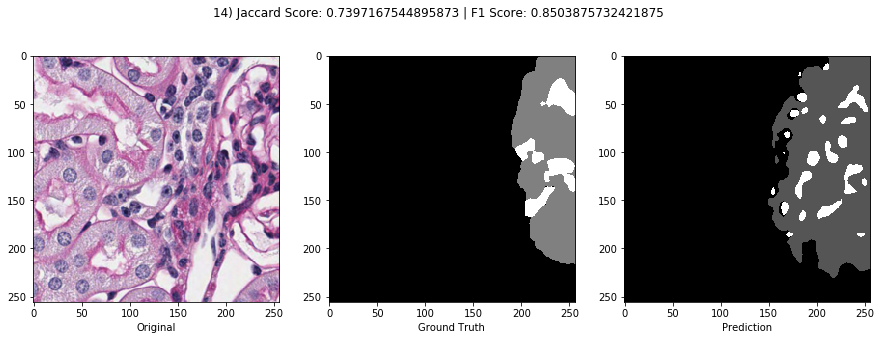

In [0]:
get_predictions(gen44,loader(PodocyteDataset('','timages/','tmasks/'), 15), 'gdrive/My Drive/IS/result')

In [0]:
 import glob, os, os.path

filelist = glob.glob(os.path.join('runs', "*/*"))
for f in filelist:
    os.remove(f)
dirlist =  glob.glob(os.path.join('runs', "*/"))
for f in dirlist:
    os.rmdir(f)

In [0]:
im = np.array(Image.open('SegmentationClass/2007_000032.png'))
np.unique(im, return_counts=True)

In [0]:
gen1 = gen
gen1.eval()
pred = gen1(val_data[0])

In [0]:
pred = pred.argmax(1)
pred = to_categorical_image(pred,21)
pred = torch.from_numpy(pred).permute(0,3,1,2)
pred.shape

In [0]:
a = get_mask_classes(val_data[0].cuda(),val_data[1].cuda())
b = get_mask_classes(val_data[0].cuda(),pred)

In [0]:
b.shape

In [0]:
f, axarr = plt.subplots(21, 2, figsize=(20,130))
k, j = 0, 0
for i in range(21):
    axarr[i][0].imshow(VOCDataset.tensor_pil(a[3,3*i:3*i+3,:,:]))
    axarr[i][1].imshow(VOCDataset.tensor_pil(b[3,3*i:3*i+3,:,:]))

In [0]:
c = nn.L1Loss()
a = torch.empty(128,156).normal_(0,1)
b = torch.empty(128,156).normal_(0,1)
l = c(a,b)

In [0]:
l

In [0]:
l2 = torch.mean(torch.abs(a-b))

In [0]:
l2

In [0]:
y = torch.randint(0, 4, (256,256))
x = torch.randint(0, 4, (256,256))
f1_score(y,x)

In [0]:
np.linspace(0,255,num=4)

In [0]:
m = np.array(Image.open('PodocyteDataset/test/masks/mask_15872-2560.png').convert('P'))

In [0]:
plt.imshow(m, cmap='gray')

In [0]:
np.unique(m, return_counts=True)

In [0]:
m.shape

In [0]:
import matplotlib.pyplot as plt
import torch
plt.imshow(torch.empty(512,512).fill_(255).numpy(), cmap='gray')

In [0]:
import torch.nn as nn
import torch

In [0]:
c = nn.BCELoss()
l = []
for i in range(3):
    l.append(c(torch.empty(3,3).fill_(1), torch.empty(3,3).fill_(0)))


In [0]:
l

[tensor(27.6310), tensor(27.6310), tensor(27.6310)]

In [0]:
import cv2


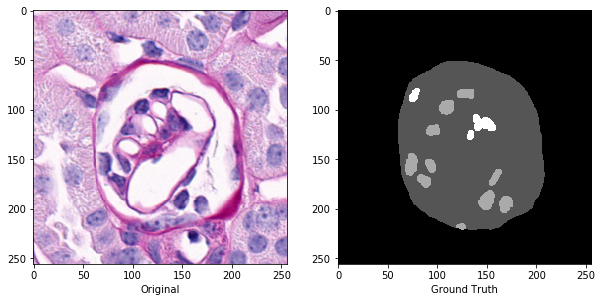

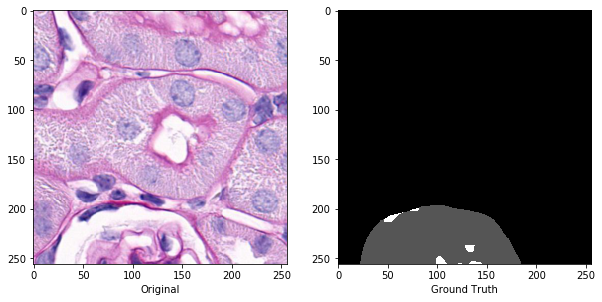

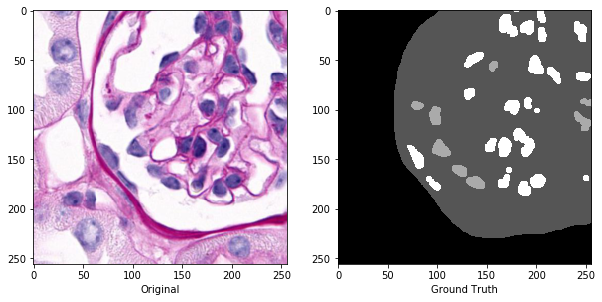

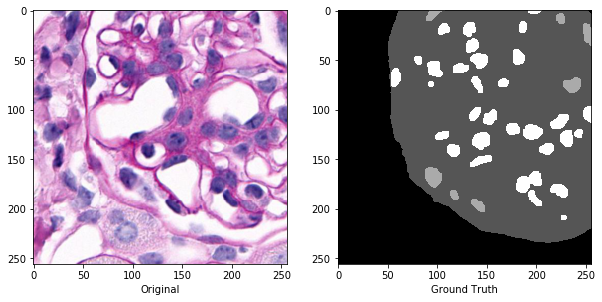

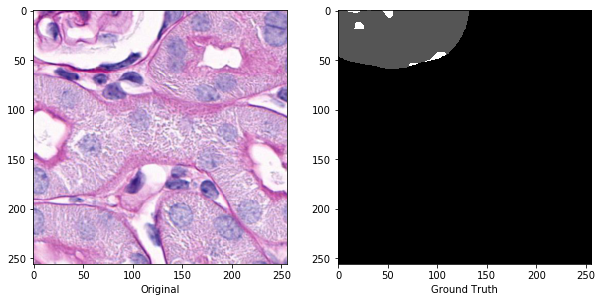

...

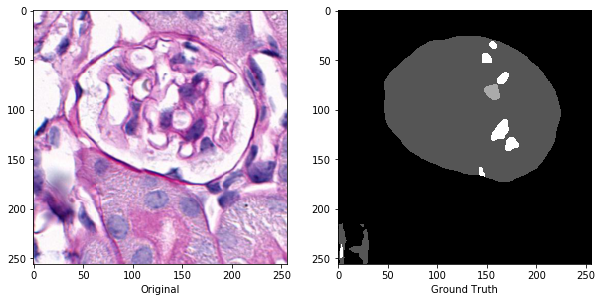

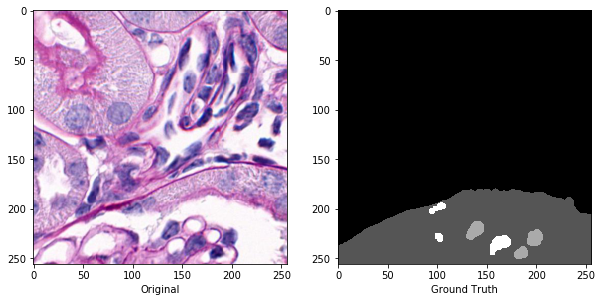

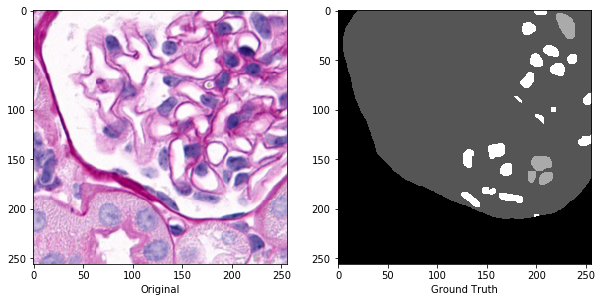

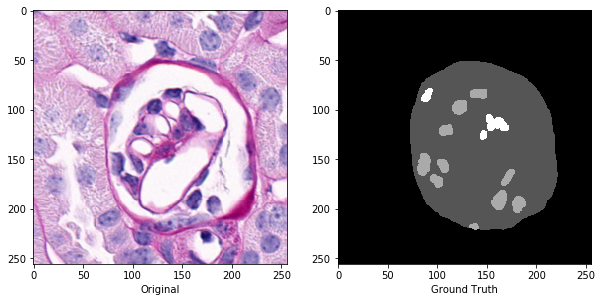

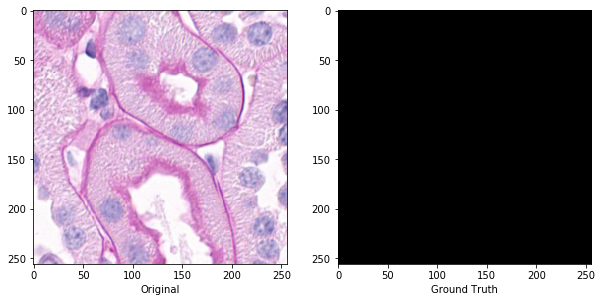

In [0]:
data, label = next(iter(data_loader))
label = label.argmax(1)
for d, l in zip(data, label):
    fig, axarr = plt.subplots(1, 2, figsize=(10,15))
    axarr[0].imshow(VOCDataset.tensor_pil(d))
    axarr[0].set_xlabel('Original')
    axarr[1].imshow(PodocyteDataset.get_graymap(l), cmap='gray')
    axarr[1].set_xlabel('Ground Truth')

input: 15 | lable: 15


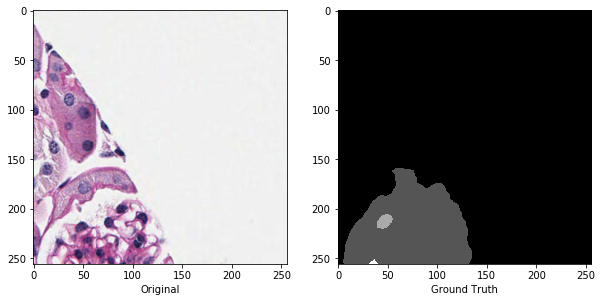

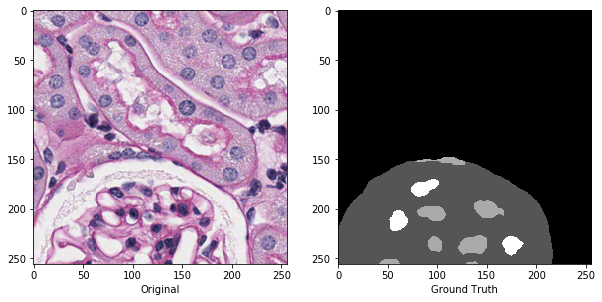

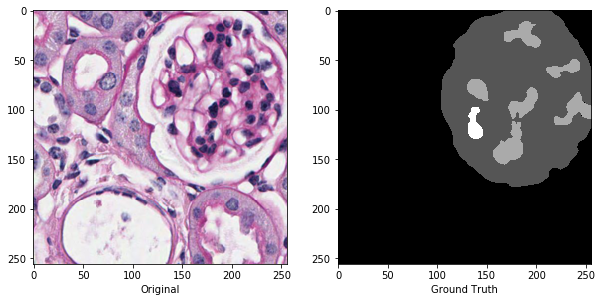

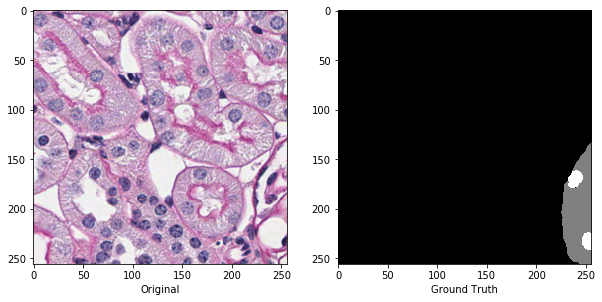

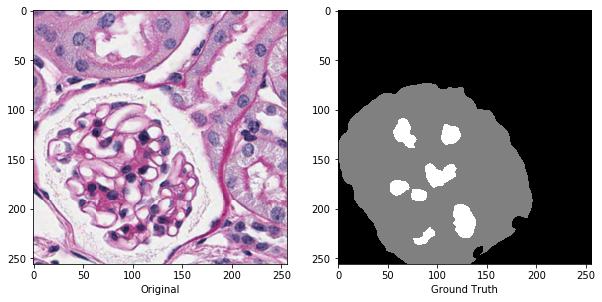

...

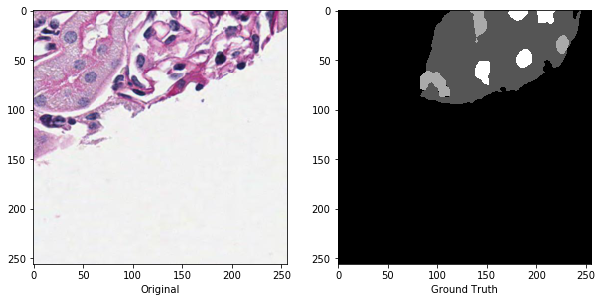

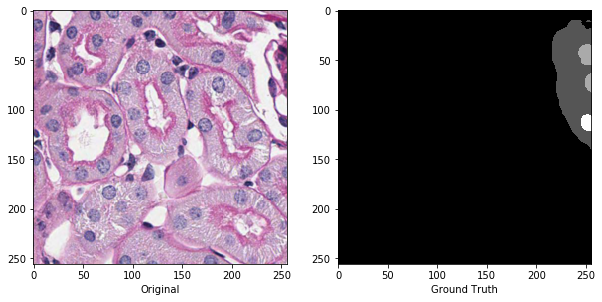

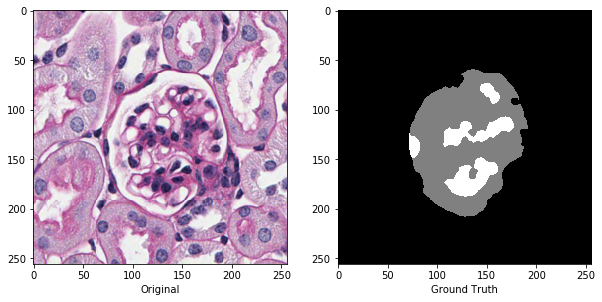

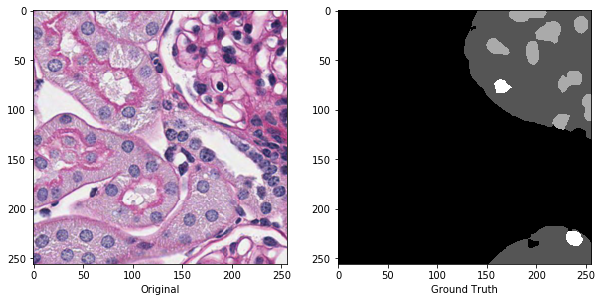

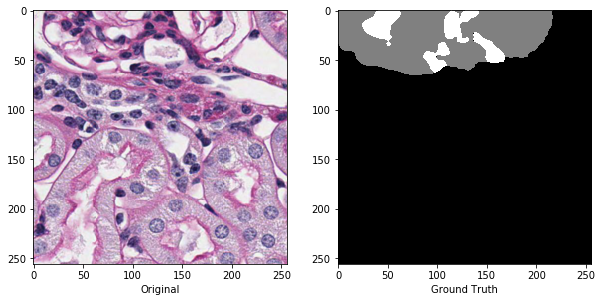

In [0]:
data, label = next(iter(loader(PodocyteDataset('','timages/','tmasks/'), 15)))
label = label.argmax(1)
for d, l in zip(data, label):
    fig, axarr = plt.subplots(1, 2, figsize=(10,15))
    axarr[0].imshow(VOCDataset.tensor_pil(d))
    axarr[0].set_xlabel('Original')
    axarr[1].imshow(PodocyteDataset.get_graymap(l), cmap='gray')
    axarr[1].set_xlabel('Ground Truth')

In [0]:
def confusion_matrix(input, target):
    b, c, h, w = input.shape
    input = input.argmax(1)
    target = target.argmax(1)
    conf = torch.empty(c,c).fill_(0)
    for i in range(b):
        for j in range(h):
            for k in range(w):
                conf[input[i][j][k]][target[i][j][k]] += 1
    return conf

def precision(conf):
    

(0, 1, 2)

In [0]:
data, label = dataset.__getitem__(0)

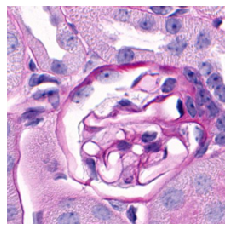

In [0]:
plt.imshow(data.permute(1, 2, 0))
plt.axis('off')
plt.savefig('original.png', bbox_inches='tight', pad_inches=0)

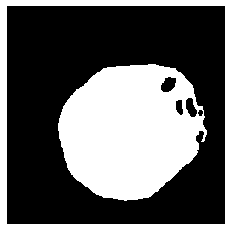

In [0]:
plt.imshow(PodocyteDataset.get_graymap(label[1]), cmap='gray')
plt.axis('off')
plt.savefig('label.png', bbox_inches='tight', pad_inches=0)

In [0]:
mask = get_mask(data.unsqueeze(0).cuda(), label[1].unsqueeze(0).cuda())

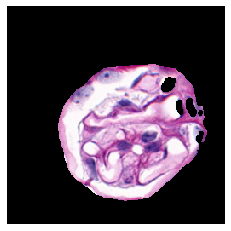

In [0]:
plt.imshow(mask.squeeze(0).cpu().permute(1,2,0))
plt.axis('off')
plt.savefig('mask.png', bbox_inches='tight', pad_inches=0)